In [ ]:
from keras.models import load_model
from collections import deque
import matplotlib.pyplot as plt
import numpy as np
import argparse
import pickle
import cv2
from tensorflow.keras.models import Model
import tensorflow as tf
from google.colab.patches import cv2_imshow
import imutils

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
# videoInPath="/content/WIN_20221106_15_51_38_Pro.mp4"
videoOutPath="test_output.avi"
yoloPath="yolo-coco"
# command line arguments in dict form
#video-- path to input video
#yolo --base path to YOLO directory
#confidence --minimum probability to filter weak detections
#threshold --threshold when applyong non-maxima suppression
args={ 'videoOut': videoOutPath , 'yolo': yoloPath , 'confidence': 0.5, 'threshold': 0.3}

In [ ]:
LABELS = open("/gdrive/My Drive/IOT_Waste_Detection/coco.names").read().strip().split("\n")
print("Toal classes {0}".format(len(LABELS)))

Toal classes 80


In [ ]:
! wget "https://pjreddie.com/media/files/yolov3.weights"

--2023-04-08 17:34:14--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  60.9MB/s    in 4.1s    

2023-04-08 17:34:18 (57.4 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
# derive the paths to the YOLO weights and model configuration
weightsPath = "/content/yolov3.weights"
configPath = "/gdrive/My Drive/IOT_Waste_Detection/yolov3.cfg"
# load our YOLO object detector trained on COCO dataset (80 classes)
net = cv2.dnn.readNetFromDarknet(configPath, weightsPath)

In [ ]:
# initialize a list of colors to represent each possible class label
np.random.seed(42)
#create random list of int type numbers from range 0-255. Size = len(LABELS), 3... 3 is for RGB
COLORS = np.random.randint(0, 255, size=(len(LABELS), 3),dtype="uint8")

In [ ]:
#Generally in a sequential CNN network there will be only one output layer at the end. 
#In the YOLO v3 architecture we are using there are multiple output layers giving out predictions.
ln_all = net.getLayerNames()
#print(ln)

ln=[]
# determine only the *output* layer names that we need from YOLO
for i in ln_all:
    if "yolo" in i:
        ln.append(i)
        
print(ln)

['yolo_82', 'yolo_94', 'yolo_106']


In [ ]:
#WORKING PROJECT
import numpy as np
import argparse
import pickle
import cv2
from google.colab.patches import cv2_imshow
import os
import time 
from keras.models import load_model
from collections import deque

classes = ['Aluminium', 'Carton', 'Glass', 'Organic Waste', 'Other Plastics', 'Paper and Cardboard', 'Plastic', 'Textiles', 'Wood']
class GradCAM:
  def __init__(self, model, classIdx, layerName=None):
    self.model = model
    self.classIdx = classIdx
    self.layerName = layerName
    if self.layerName is None:
      self.layerName = self.find_target_layer()
   
  def find_target_layer(self):
    for layer in reversed(self.model.layers):
      if len(layer.output_shape) == 4:
        return layer.name
    raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")

  def compute_heatmap(self, image, eps=1e-8):
    gradModel = Model(
			inputs=[self.model.inputs],
			outputs=[self.model.get_layer(self.layerName).output,
				self.model.output])
    with tf.GradientTape() as tape:
      inputs = tf.cast(image, tf.float32)
      (convOutputs, predictions) = gradModel(inputs)
      loss = predictions[:, self.classIdx]
    grads = tape.gradient(loss, convOutputs)
    castConvOutputs = tf.cast(convOutputs > 0, "float32")
    castGrads = tf.cast(grads > 0, "float32")
    guidedGrads = castConvOutputs * castGrads * grads
    convOutputs = convOutputs[0]
    guidedGrads = guidedGrads[0]
    weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)
    (w, h) = (image.shape[2], image.shape[1])
    heatmap = cv2.resize(cam.numpy(), (w, h))
    numer = heatmap - np.min(heatmap)
    denom = (heatmap.max() - heatmap.min()) + eps
    heatmap = numer / denom
    heatmap = (heatmap * 255).astype("uint8")
    return heatmap

  def overlay_heatmap(self, heatmap, image, alpha=0.5, colormap=cv2.COLORMAP_VIRIDIS):
    heatmap = cv2.applyColorMap(heatmap, colormap)
    output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
    return (heatmap, output)

def print_results(video, limit=None):
        #fig=plt.figure(figsize=(16, 30))
        if not os.path.exists('output'):
            os.mkdir('output')

        print("Loading model ...")
        model = load_model('/gdrive/My Drive/IOT_Waste_Detection/IOT_Waste_Model.h5')
        Q = deque(maxlen=128)
        vs = cv2.VideoCapture(video)
        writer = None
        (W, H) = (None, None)
        count = 0  
        currentFrameNumber = 1
        try:
              total = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))
              print("[INFO] {} total frames in video".format(total))
        except:
              # an error occurred while trying to determine the total number of frames in the video file
              print("[INFO] could not determine # of frames in video")
              print("[INFO] no approx. completion time can be provided")
              total = -1   
        while True:
            # read the next frame from the file
            (grabbed, frame) = vs.read()

            # if the frame was not grabbed, then we have reached the end
            # of the stream
            if not grabbed:
                break
            #break if current frame count exceeds total count
            if(currentFrameNumber > total):
                break
            # if the frame dimensions are empty, grab them
            if W is None or H is None:
                (H, W) = frame.shape[:2]

            

            # clone the output frame, then convert it from BGR to RGB
            # ordering, resize the frame to a fixed 128x128, and then
            # perform mean subtraction

            # resized = cv2.resize(orig, (256, 256))

            # image = tf.keras.preprocessing.image.load_img(path, target_size=(256, 256))
            # image = tf.keras.preprocessing.image.img_to_array(image)
            # image = np.expand_dims(image, axis=0)

            # predictions = model.predict(image)
            # cam = GradCAM(model, np.argmax(predictions[0]), "expanded_conv_6/expand")
            # heatmap = cv2.resize(cam.compute_heatmap(image), (orig.shape[1], orig.shape[0]))
            output = frame.copy()
           
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = cv2.resize(frame, (256,256)).astype("float32")
            frame = frame.reshape(256, 256, 3) / 255
            frame = tf.keras.preprocessing.image.img_to_array(frame)
            frame = np.expand_dims(frame, axis=0)

            # make predictions on the frame and then update the predictions
            # queue
            # preds = model.predict(np.expand_dims(frame, axis=0))[0]
            predictions = model.predict(frame)
            cam = GradCAM(model, np.argmax(predictions[0]), "expanded_conv_6/expand")
            heatmap = cv2.resize(cam.compute_heatmap(frame), (frame.shape[1], frame.shape[0]))
#             print("preds",preds)
            print("Grabbed frame.....{}".format(currentFrameNumber))
            Q.append(predictions)

            

            
            # (heatmap, out) = cam.overlay_heatmap(heatmap, frame, alpha=0.5)

            #cv2.rectangle(output, (0, 0), (340, 40), (0, 0, 0), -1)
            # cv2.putText(out, classes[np.argmax(predictions)], (10, 25), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

            # out = np.vstack([frame, heatmap, out])
            # out = imutils.resize(out, height=700)
            # cv2_imshow(output)
            # perform prediction averaging over the current history of
            # previous predictions
            results = np.array(Q).mean(axis=0)
            # i = (predictions > 0.50)[0]
            # label = i

            # text_color = (0, 255, 0) # default : green

            # if label: # Violence prob
            #     text_color = (0, 0, 255) # red

            # else:
            #     text_color = (0, 255, 0)


            text = "Waste Detected: {}".format(classes[np.argmax(predictions)])
            FONT = cv2.FONT_HERSHEY_SIMPLEX 

            cv2.putText(output, text, (35, 50), FONT,1.25, (0, 0, 255), 3) 

            # check if the video writer is None
            if writer is None:
                # initialize our video writer
                fourcc = cv2.VideoWriter_fourcc(*"MJPG")
                writer = cv2.VideoWriter("output/v_output.avi", fourcc, 30,(W, H), True)

            # write the output frame to disk
            writer.write(output)

            # show the output image
            cv2_imshow(output)
            key = cv2.waitKey(1) & 0xFF
            currentFrameNumber=currentFrameNumber+1

            # if the `q` key was pressed, break from the loop
            if key == ord("q"):
                break
        # release the file pointersq
        print("[INFO] cleaning up...")
        writer.release()
        vs.release()



In [ ]:
V_path = "/gdrive/My Drive/IOT_Waste_Detection/waste_1.mp4"  


Loading model ...
[INFO] 526 total frames in video
1/1 [==============================] - 9s 9s/step
Grabbed frame.....1


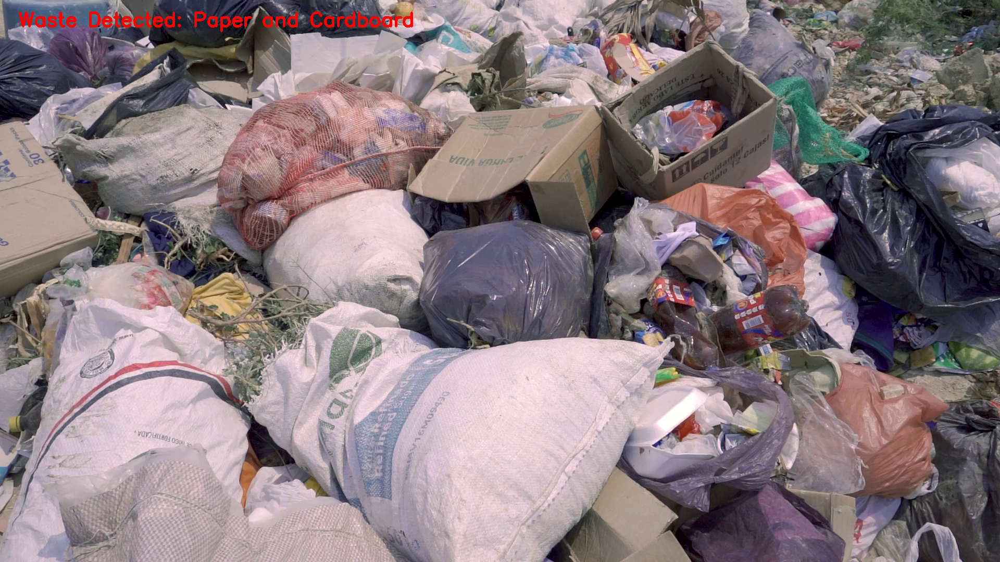

1/1 [==============================] - 0s 36ms/step
Grabbed frame.....2


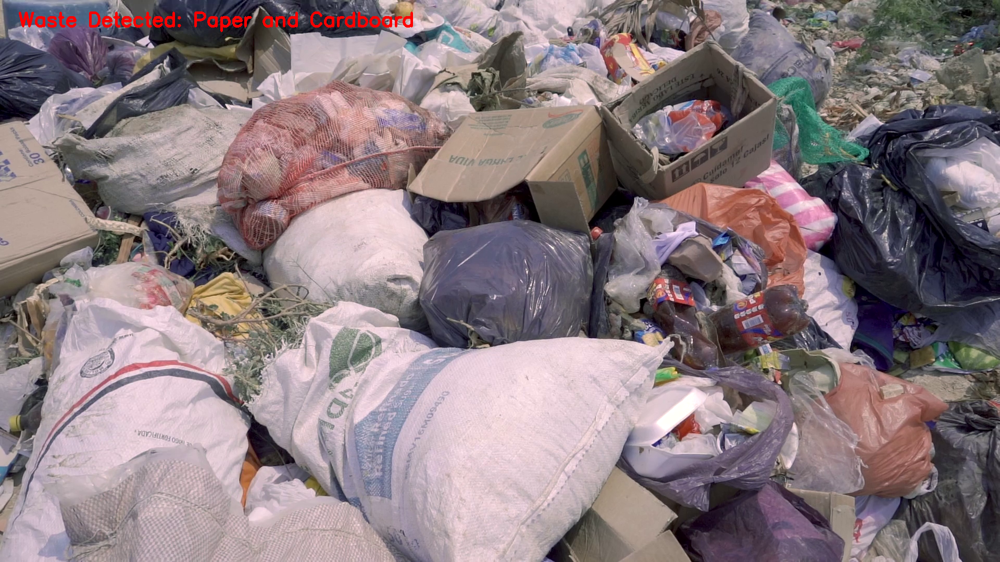

1/1 [==============================] - 0s 39ms/step
Grabbed frame.....3


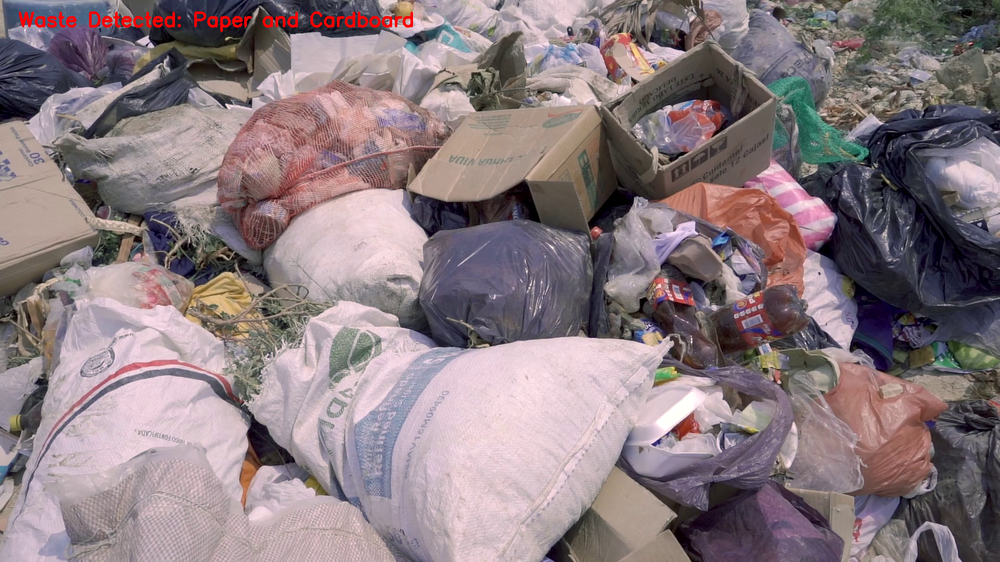

1/1 [==============================] - 0s 34ms/step
Grabbed frame.....4


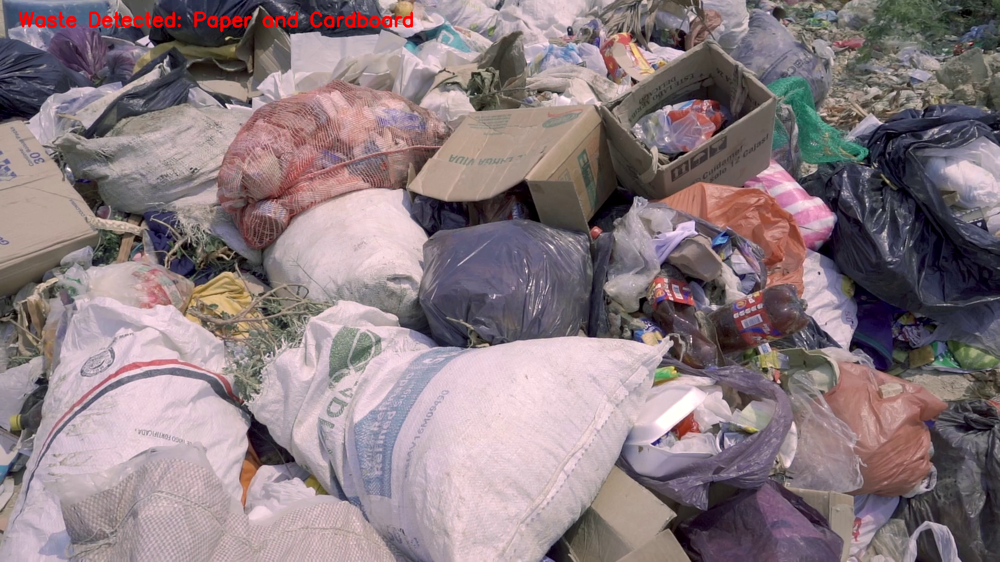

1/1 [==============================] - 0s 34ms/step
Grabbed frame.....5


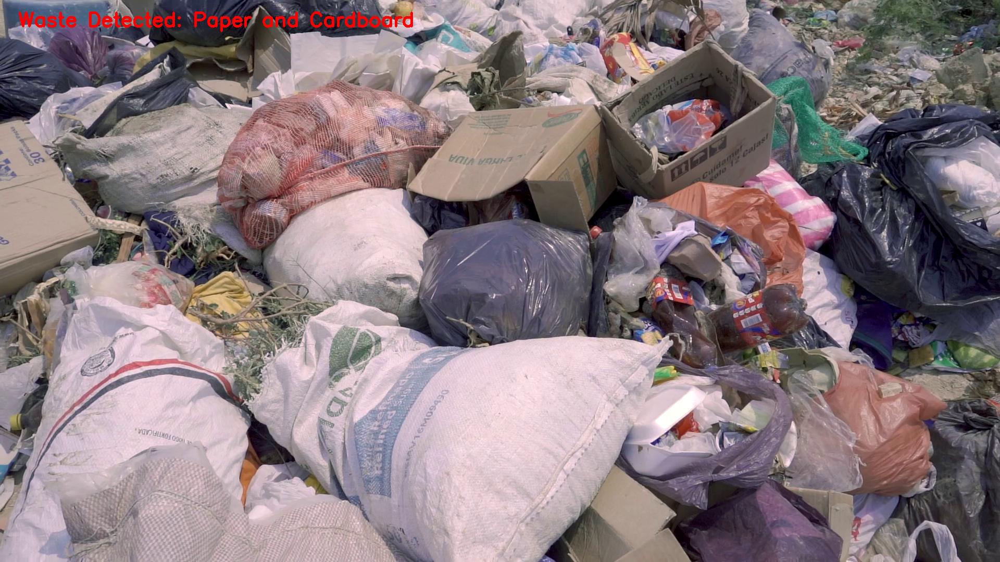

In [ ]:
print_results(V_path)

In [ ]:
# Object detection code
#Open a file pointer to the video file

vd_path = "/content/output/v_output.avi"
vs = cv2.VideoCapture(vd_path)

writer = None #Initialize video writer
(W, H) = (None, None) #Initialize frame dimensions

# try to determine the total number of frames in the video file
try:
    total = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))
    print("[INFO] {} total frames in video".format(total))
except:
    # an error occurred while trying to determine the total number of frames in the video file
    print("[INFO] could not determine # of frames in video")
    print("[INFO] no approx. completion time can be provided")
    total = -1

currentFrameNumber=1

try:
    # loop over frames from the video file stream
    while True:
        # read the next frame from the file
        (grabbed, frame) = vs.read()

        # if the frame was not grabbed, then we have reached the end of the stream
        if not grabbed:
            break

        #break if current frame count exceeds total count
        if(currentFrameNumber > total):
            break

        #break if q from keyboard is read
        if(cv2.waitKey(1) == ord('q')):
            break

        print("Grabbed frame.....{}".format(currentFrameNumber))

        # if the frame dimensions are empty, grab them
        if W is None or H is None:
            (H, W) = frame.shape[:2]

        # construct a blob from the input frame
        #why we do : preprocessing images and preparing them for classification via pre-trained deep learning models.
        blob = cv2.dnn.blobFromImage(frame, 1 / 255.0, (416, 416),swapRB=True, crop=False)

        net.setInput(blob)

        #perform a forward pass of the YOLO object detector, giving us our bounding boxes and associated probabilities
        layerOutputs = net.forward(ln)

        #yolo has now processed our image and got the data. we now just need to fetch that data
        # initialize empty lists
        boxes = []
        confidences = []
        classIDs = []

        #Let’s begin populating these lists with data from our YOLO layerOutputs
        # loop over each of the layer outputs
        for output in layerOutputs:
            # loop over each of the detections
            for detection in output:
                # extract the class ID and confidence (i.e., probability) of the current object detection
                scores = detection[5:]
                classID = np.argmax(scores)
                confidence = scores[classID]

                # filter out weak predictions by ensuring the detected probability is greater than the minimum probability
                if confidence > args["confidence"]:
                    # scale the bounding box coordinates back relative to the size of the image
                    #YOLO returns the center (x, y)-coordinates of the bounding box followed by the box width and height
                    box = detection[0:4] * np.array([W, H, W, H])

                    #astype("int") witll convert box values to int values
                    (centerX, centerY, width, height) = box.astype("int")

                    # use the center (x, y)-coordinates to derive the top-left corner of the bounding box
                    x = int(centerX - (width / 2))
                    y = int(centerY - (height / 2))

                    # update our list of bounding box coordinates, confidences and class IDs
                    boxes.append([x, y, int(width), int(height)])
                    confidences.append(float(confidence))
                    classIDs.append(classID)

        # apply non-maxima suppression to suppress weak, overlapping bounding boxes
        #All that is required is that we submit our:
        #bounding boxes , confidences , confidence threshold and NMS threshold
        idxs = cv2.dnn.NMSBoxes(boxes, confidences, args["confidence"],args["threshold"])

        #idxs now hold indexes after non maxima suppression


        #draw the boxes and class text on the frame
        if len(idxs) > 0:
            for i in idxs.flatten():
                # extract the bounding box coordinates
                (x, y) = (boxes[i][0], boxes[i][1]) #x,y--coordinate of top left corner
                (w, h) = (boxes[i][2], boxes[i][3])

                #pick the color
                color = [int(c) for c in COLORS[classIDs[i]]]

                # draw a bounding box rectangle
                cv2.rectangle(frame, (x, y), (x + w, y + h), color, 2)  #2 is the line thickness

                #prepare text
                text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])

                #put text on image at x, y-5....a bit up then the box
                cv2.putText(frame, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,0.5, color, 2)

        # check if the video writer is None
        if writer is None:
            # initialize our video writer
            fourcc = cv2.VideoWriter_fourcc(*"MJPG")

            writer = cv2.VideoWriter(args["videoOut"], fourcc, 30,(frame.shape[1], frame.shape[0]), True)

        # write the output frame to disk
        writer.write(frame)
        # if writer is None:
        #         # initialize our video writer
        #         fourcc = cv2.VideoWriter_fourcc(*"MJPG")
        #         writer = cv2.VideoWriter("output/v_output.avi", fourcc, 30,(W, H), True)

        #     # write the output frame to disk
        #     writer.write(output)

        #     # show the output image
        #     cv2_imshow(output)
        #     key = cv2.waitKey(1) & 0xFF

        currentFrameNumber=currentFrameNumber+1

except: 
  pass
    
# release the file pointers
print("[INFO] cleaning up...")

if writer is not None:
  writer.release()
  vs.release()